# Исследование рынка заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

<b>Цель</b>: подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

<b>Исходные данные</b>: датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

## Общая информация

Файл `moscow_places.csv`:

`name` — название заведения;

`address` — адрес заведения;

`category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;

`hours` — информация о днях и часах работы;

`lat` — широта географической точки, в которой находится заведение;

`lng` — долгота географической точки, в которой находится заведение;

`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
- «Средний счёт: 1000–1500 ₽»;
- «Цена чашки капучино: 130–220 ₽»;
- «Цена бокала пива: 400–600 ₽».

и так далее;

`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
- Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
- Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
- 0 — заведение не является сетевым
- 1 — заведение является сетевым

`district` — административный район, в котором находится заведение, например Центральный административный округ;

`seats` — количество посадочных мест.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import json
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster

In [2]:
pd.options.mode.chained_assignment = None

In [3]:
data = pd.read_csv('/datasets/moscow_places.csv')
data.head() #вывод первых пяти строк таблицы

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info() #вывод общей информации о датасете

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Датасет содержит записи о 8406 заведениях. Есть столбцы с пропусками: hours — часы работы, price — категория цен, avg_bill — средняя стоимость заказа, middle_avg_bill — оценка среднего счета, middle_coffee_cup — оценка стоимости чашки капучино, seats — количество посадочных мест. 

Типы данных выглядят корректными. Можно исправить тип лишь в столбце seats, т.к. количество мест может быть только целым числом.

## Предобработка данных

### Изменение типов данных

Исправим тип данных в столбце с количеством посадочных мест.

In [5]:
data['seats'] = data['seats'].astype('Int64') #изменение типа данных на int

Типы данных в остальных столбцах оставляем, как есть.

### Обработка пропусков

In [6]:
def pass_value_barh_1(df):
    try:
        (
            (df.isna().mean()*100)
            .to_frame()
            .rename(columns = {0:'space'})
            .query('space > 0')
            .sort_values(by = 'space', ascending = True)
            .plot(kind = 'barh', figsize = (19,6), legend = False, grid=True, fontsize = 14)
            .set_title('Доля пропусков от общего количества строк' + "\n", fontsize = 16)
        ); 
        plt.xlabel('Доля пропусков в столбце, %', fontsize = 14)
        plt.ylabel('Название столбца', fontsize = 14)
        plt.xlim(0, 100)
    except:
        print('пропусков не осталось, или произошла ошибка в первой части функции ')

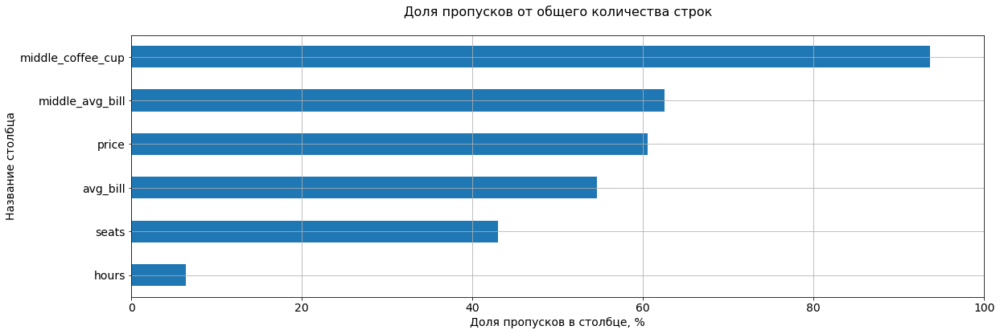

In [7]:
#вывод графика со столбцами с пропусками и долями пропусков от общего количества строк
pass_value_barh_1(data)

Проверим, есть ли пропуски в столбцах `middle_avg_bill` и `middle_coffee_cup` при наличии нужной информации в столбце `avg_bill`. Если таковые найдутся, то сможем заполнить их самостоятельно.

In [8]:
#вывод строк, где цена чашки капучино в avg_bill указана, но в middle_coffee_cup значение пустое
data[(data['avg_bill'].isna() == False) & (data['middle_avg_bill'].isna() == True) 
     & (data['avg_bill'].str.find('Средний счёт') != -1)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [9]:
#вывод строк, где цена чашки капучино в avg_bill указана, но в middle_coffee_cup значение пустое
data[(data['avg_bill'].isna() == False) & (data['middle_coffee_cup'].isna() == True) 
     & (data['avg_bill'].str.find('Цена одной чашки капучино') != -1)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Вывод по условиям пуст, следовательно, таких пропусков нет.

Заполнить пропуски в остальных столбцах не представляется возможным.

### Обработка дубликатов

Проверим уникальные значения в категориальных столбцах. Так мы сможем отследить наличие неявных дубликатов.

In [10]:
#вывод списка уникальных значений в столбце category
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [11]:
#вывод списка уникальных значений в столбце district
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [12]:
#вывод списка уникальных значений в столбце price
data['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [13]:
#вывод списка уникальных значений в столбце chain
data['chain'].unique()

array([0, 1])

Неявных дубликатов в столбцах с категориями, округами и флагом сети не найдено.

Уникальных значений в столбце `name` очень много, но все же попробуем найти неявные дубликаты и среди них.

In [14]:
#приведение названий к нижнему регистру
data['name'] = data['name'].str.lower()
#вывод списка названий
with pd.option_context("display.max_rows", None): 
    display(pd.Series(data['name'].sort_values().unique()))

0                                             #кешбэккафе
1                             +39 pizzeria mozzarella bar
2                                                  1 этаж
3                                         1-я креветочная
4                                       10 идеальных пицц
5                                               1001 ночь
6                                                100ловая
7                                               100лоффка
8                                                      13
9                                           13 chef doner
10                                         15 kitchen+bar
11                                               15-й шар
12                                                16 июня
13                                                16 тонн
14                                               18 грамм
15                                 1901 comfort food zone
16                                                     1у
17            

In [15]:
#замена найденных неявных дубликатов
data['name'] = data['name'].replace(
    {
        "vip wok and sushi" : "vip wok & sushi",
        "white fox cafe" : "white fox",
        "алло пицца" : "алло! пицца",
        "аль бухари" : "аль-бухари",
        "белла чао пицца и кофе" : "белла чао",
        "в парке вкуснее" : "в парке вкуснее!",
        "гастрорюмочная шесть you шесть" : "гастрорюмочная шесть-you-шесть",
        "донец кебаб" : "донер кебаб",
        "есть хинкали&пить вино" : "есть хинкали & пить вино",
        "кафе контдитерская кузина" : "kuzina",
        "кулинариум - кулинария, пироги, салаты" : "кулинариум",
        "матрёшка" : "матрешка",
        "хлеба&зрелищ пиццерия" : "хлеба&зрелищ",
        "чайхона № 1" : "чайхона №1",
        "шашлыкофф" : "шашлыкоff",
        "яндекс.лавка" : "яндекс лавка"
    }
)

data['name'] = data['name'].replace(
    ["jeffrey's", "jeffrey's coffeeshop", "jeffrey's кофе и сидр", "jeffrey’s coffeeshop"], "jeffrey's coffee"
)
data['name'] = data['name'].replace(
    ["доминос пицца", "домино'с"], "домино'с пицца"
)
data['name'] = data['name'].replace(
    ["хинкали - gали!", "хинкали gали", "хинкали-gали"], "хинкали-gали!"
)

В процессе поиска неявных дубликатов в списке названий заведений были найдены назван я почтоматов Халвы. Поскольку изучаем мы заведения общепита, несколько строк с почтоматами предлагаю удалить.

In [16]:
#удаление строк с почтоматами из таблицы
data = data[data['name'] != 'халва, сеть почтоматов'].reset_index(drop=True)

Подсчитаем количество явных дуликатов, которые, в том числе, могли добавиться после устранения неявных дубликатов.

In [17]:
data.duplicated().sum() #подсчет количества явных дубликатов

0

Дубликатов нет, можем переходить к исследованию.

### Добавление столбцов

In [18]:
pd.options.display.max_colwidth = 400

Для дальнейшего исследования потребуется добавить дополнительные столбцы: с названием улицы, с отметкой о круглосуточности работы и, для оформления графиков, столбец с текстовой отметкой сетевое/несетевое.

In [19]:
#добавление столбца с разбиением адреса на элементы
data['full_address'] = data['address'].map(lambda x: x.split(', '))

In [20]:
#функция, извлекающая название улицы, либо места, если улица не указана
def get_street(full_address):
    try:       
        for j in range(len(full_address)):
            if 'улица' in full_address[j] or 'проспект' in full_address[j] or 'проезд' in full_address[j] or \
            'жилой комплекс' in full_address[j] or 'микрорайон' in full_address[j] or \
            'километр' in full_address[j] or 'шоссе' in full_address[j] or 'бульвар' in full_address[j] \
            or 'парк' in full_address[j] or 'переулок' in full_address[j] or 'набережная' in full_address[j] \
            or 'квартал' in full_address[j] or 'аллея' in full_address[j]:
                street = full_address[j]
                    
        return street
    except:
        pass

In [21]:
#применение функции к столбцу с разбитым адресом
data['street'] = data['full_address'].apply(get_street)
#подсчет пустых значений в столбце с улицей
data['street'].isna().sum()

265

В столбце с названием улицы осталось немного пропусков. Это связано с тем, что название улицы, или места. сопоставимого с улицей, указано не для всех заведений. Предлагаю оставить эти ячейки пустыми.

In [22]:
#добавление столбца с отметкой о круглосуточности
data['is_24_7'] = data['hours'].apply(lambda x: True if x == 'ежедневно, круглосуточно' else False)

In [23]:
#добавление столбца с текстовой отметкой сетевое/не сетевое
data['chain_text'] = data['chain'].apply(lambda x: 'сетевое' if x == 1 else 'несетевое')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,full_address,street,is_24_7,chain_text
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,<NA>,"[Москва, улица Дыбенко, 7/1]",улица Дыбенко,False,несетевое
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4,"[Москва, улица Дыбенко, 36, корп. 1]",улица Дыбенко,False,несетевое
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45,"[Москва, Клязьминская улица, 15]",Клязьминская улица,False,несетевое
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,<NA>,"[Москва, улица Маршала Федоренко, 12]",улица Маршала Федоренко,False,несетевое
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148,"[Москва, Правобережная улица, 1Б]",Правобережная улица,False,сетевое


## Анализ данных о заведениях общепита

### Общий анализ заведений общепита

In [24]:
#настройка стиля графиков
sns.set_palette('deep') 
sns.set_style('whitegrid')
colors = sns.color_palette('deep')

Узнаем, какие категории заведений представлены в данных. 

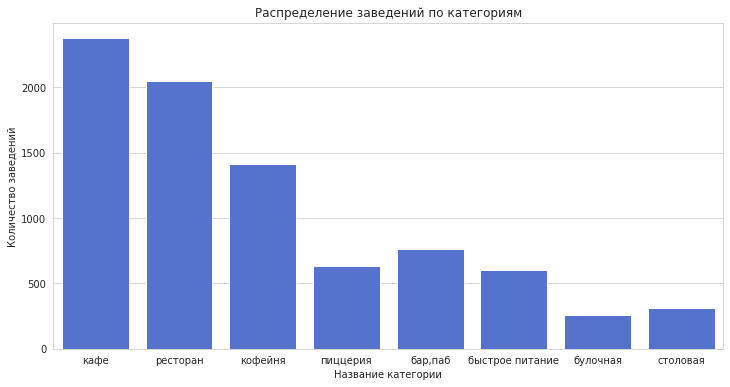

,category,amount
3,кафе,2374
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


In [25]:
cat_data = data.groupby('category', as_index=False)['name'].count()\
.sort_values(by='name',ascending=False).rename(columns={'name' : 'amount'})
#график распределения заведений по категориям
plt.figure(figsize=(12, 6))
ax = sns.countplot(x='category', data=data, color='#4169E1') 
ax.set_title('Распределение заведений по категориям') 
ax.set_ylabel('Количество заведений')
ax.set_xlabel('Название категории')
plt.show()

#вывод подсчета количества заведений по категориям
display(cat_data)

Самые многочисленные категории заведений — кафе и рестораны. Булочные и столовые — в меньшинстве.

Чтобы узнать, какое количество посадочных мест в среднем содержат заведения в каждой категории, построим график и выведем таблицу с точными значениями.

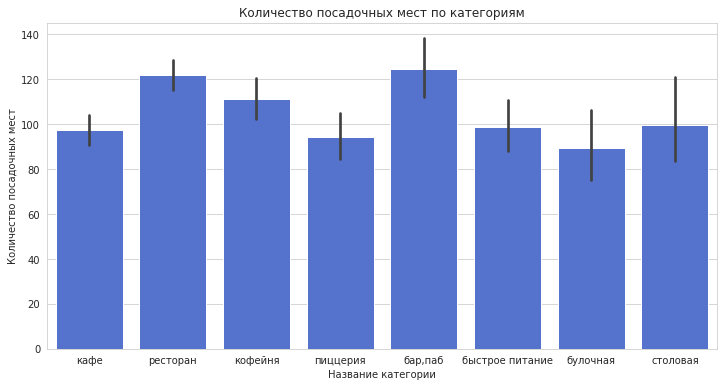

,category,seats
0,"бар,паб",124.532051
6,ресторан,121.944094
4,кофейня,111.199734
7,столовая,99.75
2,быстрое питание,98.891117
3,кафе,97.57765
5,пиццерия,94.496487
1,булочная,89.385135


In [26]:
#график распределения посадочных мест по категориям
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='category', y='seats', data=data, color='#4169E1') 
ax.set_title('Количество посадочных мест по категориям')
ax.set_xlabel('Название категории')
ax.set_ylabel('Количество посадочных мест')
plt.show()

#вывод подсчета количества посадочных мест по категориям
display(data.groupby('category', as_index=False)['seats'].mean().sort_values(by='seats', ascending=False))

В среднем, наиболее вместительны бары, пабы, рестораны и кофейни. Наиболее компактными являются булочные, пиццерии и кафе.

С помощью диаграммы размаха изучим разброс количества посадочных мест, медианное количество и диапазон нормальных значений.

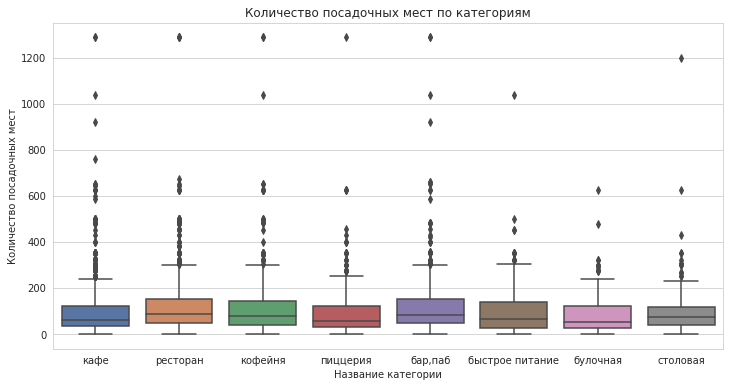

,category,seats
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


In [27]:
#диаграмма размаха посадочных мест по категориям
plt.figure(figsize=(12, 6))
ax = sns.boxplot(x='category', y='seats', data=data) 
ax.set_title('Количество посадочных мест по категориям')
ax.set_xlabel('Название категории')
ax.set_ylabel('Количество посадочных мест')
plt.show()

#вывод подсчета медианного количества посадочных мест по категориям
display(data.groupby('category', as_index=False)['seats'].median().sort_values(by='seats', ascending=False))

Среднее количество ощутимо выше медианнного за счет очень больших по вместительности заведений, но порядок категорий, отсортированных по убыванию значений практически такой же. Лидеры по вместительности — рестораны, бар, пабы, кофейни. Более компактны — булочные, пиццерии и кафе.

Рассмотрим соотношение сетевых и несетевых заведений в датасете. 

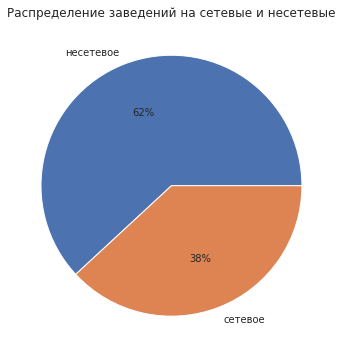

,chain_text,amount
0,несетевое,5200
1,сетевое,3202


Соотношение несетевые/сетевые: 1.6


In [28]:
#график распределения заведений по признаку
chain_data = data.groupby('chain_text', as_index=False)['name'].count().sort_values(by='name', 
            ascending=False).rename(columns={'name' : 'amount'})
ax = chain_data.plot(kind='pie', y='amount', labels=chain_data['chain_text'], colors = colors, 
                   autopct='%.0f%%', figsize=(12, 6), legend=False) 
ax.set_title('Распределение заведений на сетевые и несетевые')
ax.set_ylabel(None)
plt.show()
#вывод подсчета количества сетевых и не сетевых заведений
display(chain_data)
print('Соотношение несетевые/сетевые:', round(len(data[data['chain'] == 0]) / len(data[data['chain'] == 1]), 1))

Несетевых заведений гораздо больше, в 1,6 раз. 

Узнаем, какие категории заведений чаще являются сетевыми.

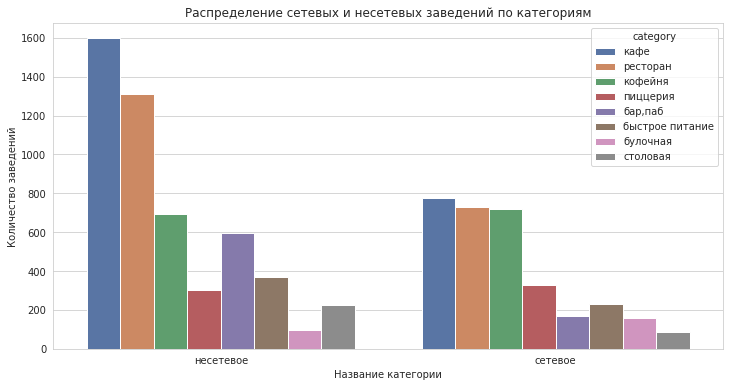

In [29]:
#подсчет количества сетевых и несетевых заведений по категориям
chain_cat = data.groupby(['chain_text', 'category'], as_index=False)['name'].count()

#график распределения сетевых и несетевых заведений по категориям
plt.figure(figsize=(12, 6))
ax = sns.countplot(x='chain_text', data=data, hue='category') 
plt.title('Распределение сетевых и несетевых заведений по категориям')
plt.xlabel('Название категории')
plt.ylabel('Количество заведений')
plt.show()

Среди сетевых заведений больше всего кафе, ресторанов и кофеен, а меньше всего столовых и булочных. Эти же категории лидируют и в общем. Среди несетевых тройка лидеров среди категорий та же, но кафе и рестораны выделяются более значительно. В меньшинстве среди несетевых тоже булочные и столовые.

Найдем топ-15 популярных сетей в Москве (по количеству заведений этой сети). 

In [30]:
#составление списка из топ-15 сетей по количеству заведений
top_chain = (
    data[data['chain'] == 1].groupby(['name','category'], as_index=False)['address'].count()
    .sort_values(by='address', ascending=False)
    .rename(columns={'address':'amount'}).head(15)
)

#столбчатый график топ-15 сетей по количеству заведений
fig = px.bar(top_chain, x='name', y='amount', color='category', 
             title='Топ-15 популярных сетевых заведений в Москве по количеству заведений',
             labels={'amount': 'Количество заведений', 'name': 'Название сети', 'category': 'Категория'})
fig.show()

Абсолютный лидер топа — Шоколадница, крайне популярная сеть кофеен. Второе и третье места занимают Домино'с пицца и Додо пицца соответственно. 

По графику видно, что чаще всего популярные сети относятся к категории кофеен.

Отобразим общее количество заведений и количество заведений каждой категории по административным районам Москвы.

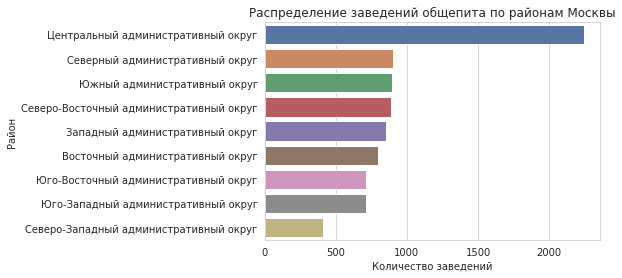

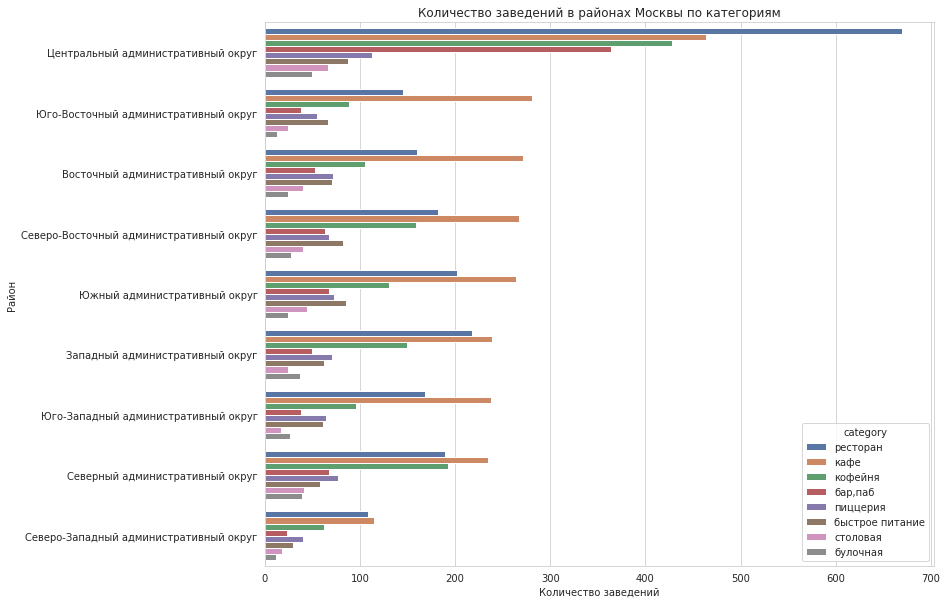

In [31]:
#подсчет количества заведений по районам по категориям
districts = data.groupby('district', as_index=False)['name'].count().rename(columns={'name':'amount'})\
.sort_values(by='amount', ascending=False)
district_cat = data.groupby(['district', 'category'], as_index=False)['name'].count()\
.sort_values(by='name', ascending=False).rename(columns={'name':'amount'})

#построение столбчатого графика количества заведений по районам
ax = sns.barplot(x='amount', y='district', data=districts) 
ax.set_title('Распределение заведений общепита по районам Москвы')
ax.set_ylabel('Район')
ax.set_xlabel('Количество заведений')
plt.show()

#построение столбчатого графика количества заведений по районам по категориям
plt.figure(figsize=(12, 10))
ax = sns.barplot(x='amount', y='district', data=district_cat, hue='category') 
ax.set_title('Количество заведений в районах Москвы по категориям')
ax.set_xlabel('Количество заведений')
ax.set_ylabel('Район')
plt.show()

По количеству заведений общепита лидирует Центральный административный округ, что ожидаемо. Отметим, что в ЦАО наиболее многочисленной категорией являются рестораны, несмотря на то, что в целом по датасету лидируют кафе. Кафе лидируют по количеству во всех остальных районах.

Меньше всего заведений в Северо-Западном административном округе.

Изучим распределение средних рейтингов по категориям заведений, есть ли видимые отличия.

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


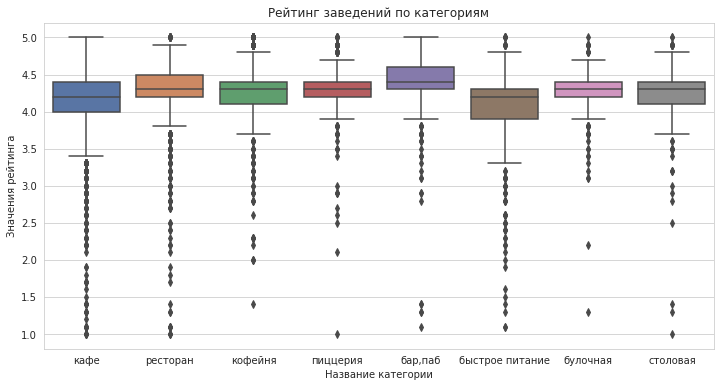

In [32]:
#подсчет средних рейтингов по категориям
avg_rate = data.groupby('category', as_index=False)['rating'].mean().sort_values(by='rating', ascending=False)
avg_rate['rating'] = round(avg_rate['rating'], 2)
# вывод средних рейтингов по категориям
display(avg_rate)

#построение диаграммы размаха рейтингов по категориям
plt.figure(figsize=(12, 6))
ax = sns.boxplot(x='category', y='rating', data=data) 
ax.set_title('Рейтинг заведений по категориям')
ax.set_xlabel('Название категории')
ax.set_ylabel('Значения рейтинга')
plt.show()


Средние значения (указаны в таблице) отличаются не слишком сильно. Нет средних рейтингов ниже 4 и выше 4.4. Более подробную картину можно получить из диаграммы размаха, где видим, что:
- для баров и пабов нормально получать оценки от 4 до 5 баллов, а все, что ниже считается выбросами 
- самый большой разбег по оценкам у кафе и быстрого питания. Ситуация, когда у заведения рейтинг ниже 3.5, достаточно часто встречается и считается нормой.
- остальные категории заведений, как правило, не опускаются по рейтингу ниже 3.5, но и редко приближаются к 5 баллам

Для большей наглядности построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [33]:
#подсчет среднего рейтинга заведений по районам
rating_data = data.groupby('district', as_index=False)['rating'].agg('mean')

In [34]:
#загрузка JSON-файла с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
#координаты центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

In [35]:
#создание карты Москвы
mc = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

#создание хороплета и добавление его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(mc)

#вывод карты
mc

По картограмме видно, что наиболее высокий рейтинг имеют заведения в Центральном административном округе. За ним идут Северный и Северо-Западный. Наиболее низкий средний рейтинг — в Юго-Восточном округе.

Отобразим все заведения на карте.

In [36]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
marker_cluster = MarkerCluster().add_to(m)

#функция, которая создаёт маркер в текущей точке и добавляет его в кластер
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

#применение функции create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

#вывод карты
m

По карте хорошо видно, что основное скопление заведений общепита приходится на ЦАО.

Найдем топ-15 улиц по количеству заведений.

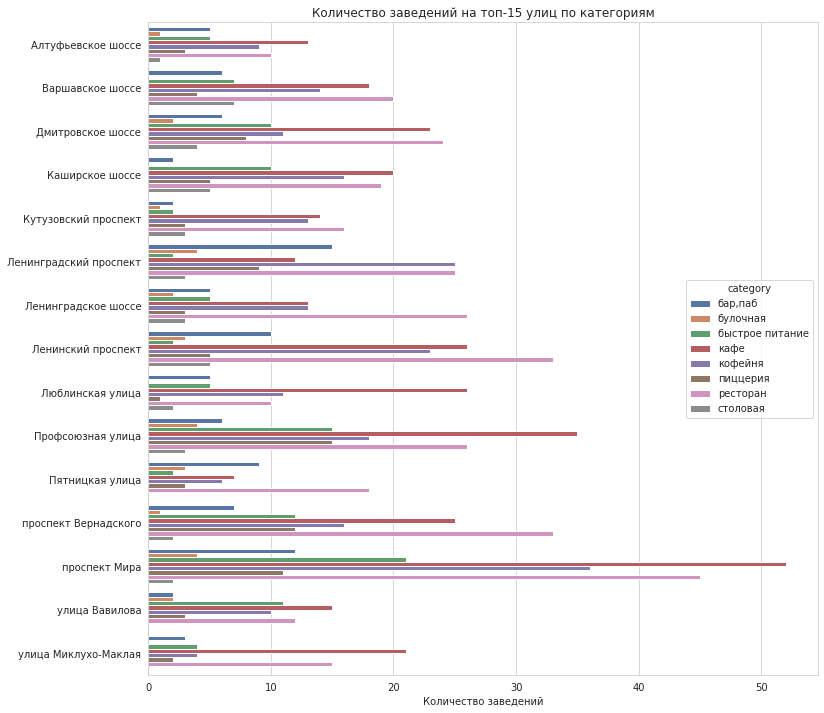

In [37]:
#подсчет заведений на улицах с определением топ-15 улиц по количеству заведений
top_street = (
    data.groupby('street', as_index=False)['name'].count().sort_values(by='name', ascending=False)
    .rename(columns={'name':'amount'}).head(15)
)
#сохранения списка топ-15 улиц
top_street_name = top_street['street']
#фильтрация данных по топ-15 улицам и подсчет количества заведений по категориям
top_street_data = (
    data.query('street in @top_street_name').groupby(['street', 'category'], as_index=False)['name'].count()
    .rename(columns={'name':'amount'})
                 )
#построение графика количества заведений по категориям для топ-15 улиц 
plt.figure(figsize=(12, 12))
ax = sns.barplot(x='amount', y='street', data=top_street_data, hue='category') 
ax.set_title('Количество заведений на топ-15 улиц по категориям')
ax.set_xlabel('Количество заведений')
ax.set_ylabel(None)
plt.show()

Среди самых популярных улиц наибольшее количество кафе, ресторанов и кофеен приходится на проспект Мира. Также по количеству ресторанов лидируют проспекты Вернадского и Ленинский. Второе место по количеству кафе занимает улица Профсоюзная, а второе место по количеству кофеен занимает Ленинградский проспект.

Изучим, как распределяются цены в заведениях по районам. Для этого построим фоновую картограмму (хороплет) с медианными значениями среднего чека для каждого района. Для расчета медианного среднего чека будем использовать столбец middle_avg_bill с примерной стоимостью заказа в рублях.

In [38]:
district_bill = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')

#создание карты Москвы
mb = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

#создание хороплета по средним чекам и добавление его на карту
Choropleth(
    geo_data=state_geo,
    data=district_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Медианный средний чек по районам'
).add_to(mb)

#вывод карты
mb

Отметим, что удаленность от центра не всегда влияет на средний чек. Действительно, медианный средний чек наиболее высокий в центре, но западные районы не отстают. Наиболее низкий средний чек на юге, юго-востоке и северо-востоке. 

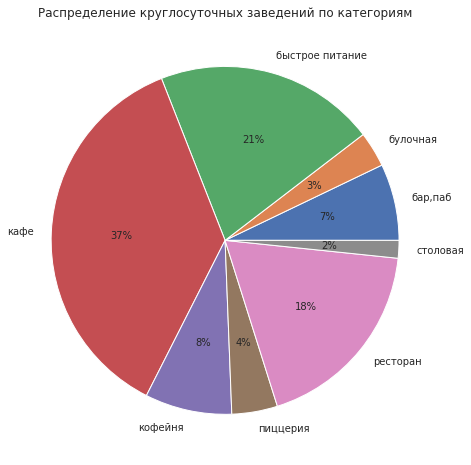

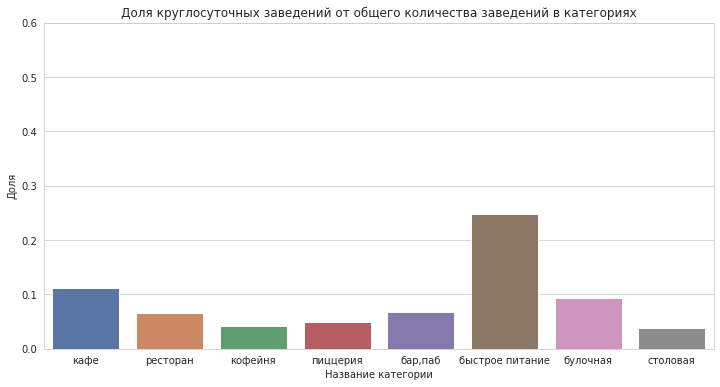

In [39]:
cat_24_7 = data[data['is_24_7'] == True].groupby('category', as_index=False)['name'].count()\
.rename(columns={'name':'amount'})

#построение графика количества круглосуточных заведений по категориям  
ax = cat_24_7.plot(kind='pie', y='amount', labels=cat_24_7['category'], colors = colors, 
                   autopct='%.0f%%', figsize=(12, 8), legend=False)  
ax.set_title('Распределение круглосуточных заведений по категориям')
ax.set_ylabel(None)
plt.show()

#построение графика долей круглосуточных заведений по категориям  
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='category', y='is_24_7', data=data, estimator=np.mean, ci=None) 
ax.set_title('Доля круглосуточных заведений от общего количества заведений в категориях')
ax.set_xlabel('Название категории')
ax.set_ylabel('Доля')
ax.set_ylim(0, 0.6)
plt.show()

В абсолютных значениях больше всего круглосуточных заведений среди кафе. На втором месте — быстрое питание, на третьем — рестораны. 

Но самая высокая доля круглосуточных заведений от общего количества заведений в категории быстрое питание.

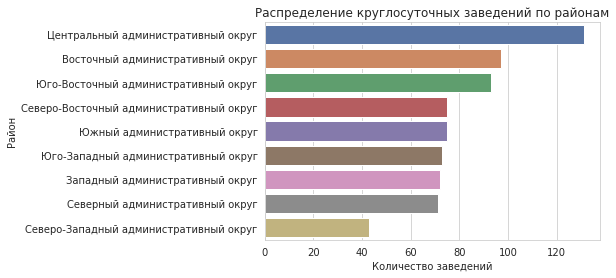

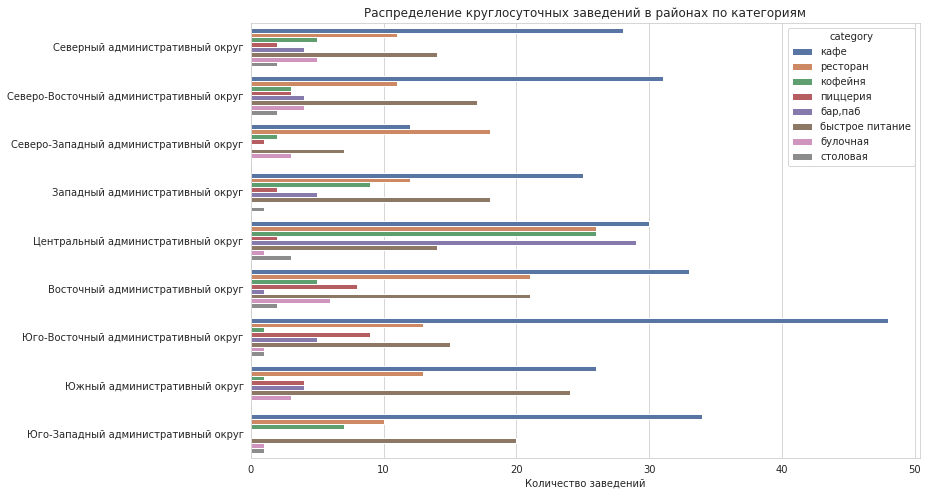

In [40]:
dist_24_7 = data[data['is_24_7'] == True].groupby('district', as_index=False)['name'].count()\
.rename(columns={'name':'amount'}).sort_values(by='amount', ascending=False)

#построение графика распределения круглосуточных заведений по районам 
ax = sns.barplot(x='amount', y='district', data=dist_24_7)   
ax.set_title('Распределение круглосуточных заведений по районам')
ax.set_xlabel('Количество заведений')
ax.set_ylabel('Район')
plt.show()
             
#построение графика количества круглосуточных заведений в районах по категориям 
plt.figure(figsize=(12, 8))
ax = sns.barplot(x='is_24_7', y='district', data=data, hue='category', estimator=np.sum, ci=None) 
ax.set_title('Распределение круглосуточных заведений в районах по категориям')
ax.set_xlabel('Количество заведений')
ax.set_ylabel(None)
plt.show()

Больше всего круглосуточных заведений в центре, также центр лидирует по количеству круглосуточных баров, пабов, ресторанов, кофеен и столовых. Круглосуточных кафе и пиццерий больше всего на юго-востоке. По круглосуточному быстрому питанию лидирует юг. Круглосуточные булочные находятся, в основном, на востоке. 

<b>Выводы по общему анализу заведений</b>: 

1. Категории заведений:
- самые многочисленные категории заведений в датасете — кафе и рестораны, булочные и столовые — в меньшинстве
- наиболее вместительны бары, пабы, рестораны и кофейни, а наиболее компактными являются булочные, пиццерии и кафе
- несетевых заведений больше, чем сетевых, в 1,6 раз

2. Сетевые заведения:
- среди сетевых заведений больше всего кафе, ресторанов и кофеен, а меньше всего столовых и булочных; среди несетевых тоже больше всего кафе, ресторанов и кофеен, но кафе и рестораны выделяются более значительно, а в меньшинстве среди несетевых тоже булочные и столовые
- самая популярная сеть по количеству заведений — Шоколадница, второе и третье места занимают Домино'с пицца и Додо пицца соответственно 
- чаще среди сетей-лидеров встречаются кафе, кофейни — на втором месте, рестораны — на третьем

3. Заведения по районам:
- по количеству заведений общепита лидирует Центральный административный округ, наиболее многочисленной категорией в центре являются рестораны, а кафе преобладают по количеству во всех остальных районах
- меньше всего заведений общепита в Северо-Западном административном округе

4. Средние значения рейтинга по категориям заведений отличаются не слишком сильно. Нет средних рейтингов ниже 4 и выше 4.4:
- для баров и пабов нормально получать оценки от 4 до 5 баллов, а все, что ниже считается выбросами 
- самый большой разбег по оценкам у кафе и быстрого питания. Для этих категорий ситуация, когда у заведения рейтинг ниже 3.5, достаточно часто встречается и считается нормой.
- остальные категории заведений, как правило, не опускаются по рейтингу ниже 3.5, но и редко приближаются к 5 баллам
- наиболее высокий рейтинг имеют заведения в Центральном административном округе, за ним идут Северный и Северо-Западный. Наиболее низкий средний рейтинг — в Юго-Восточном округе.

5. Среди самых популярных улиц наибольшее количество кафе, ресторанов и кофеен приходится на проспект Мира. Также по количеству ресторанов лидируют проспекты Вернадского и Ленинский. Второе место по количеству кафе занимает улица Профсоюзная, а второе место по количеству кофеен занимает Ленинградский проспект.

6. Удаленность от центра не всегда влияет на средний чек. Действительно, медианный средний чек наиболее высокий в центре, но западные районы не отстают. Наиболее низкий средний чек на юге, юго-востоке и северо-востоке.

7. В абсолютных значениях больше всего круглосуточных заведений среди кафе, но самая высокая доля круглосуточных заведений от общего количества заведений в категории быстрое питание.

8. Больше всего круглосуточных заведений в центре, также центр лидирует по количеству круглосуточных баров, пабов, ресторанов, кофеен и столовых. Круглосуточных кафе и пиццерий больше всего на юго-востоке. По круглосуточному быстрому питанию лидирует юг. Круглосуточные булочные находятся, в основном, на востоке. 


### Заведения на улицах, на которых находится только один объект общепита

Найдем улицы, на которых находится только один объект общепита. Узнаем, к каким категориям относятся эти заведения, и какие средние рейтинги наблюдаются в этих категориях.

In [41]:
#подсчет заведений на улицах
streets = (
    data.groupby('street', as_index=False)['name'].count().sort_values(by='name', ascending=False)
    .rename(columns={'name':'amount'})
)
#создание списка улиц с одним заведением общепита
one_street = streets[streets['amount'] == 1]['street']
#фильтрация заведений, которые находятся на улицах из списка
one_street_places = data.query('street in @one_street')

In [42]:
#подсчет доли "одиноких" заведений от общего количества по категориям
one_street_cat = (
    one_street_places.groupby('category', as_index=False)['name'].count().rename(columns={'name' : 'amount'})
)
all_cat = data.groupby('category', as_index=False)['name'].count().rename(columns={'name' : 'total'})
one_street_cat = one_street_cat.merge(all_cat, on='category')
one_street_cat['share_of_total, %'] = round(one_street_cat['amount'] / one_street_cat['total']*100, 2)

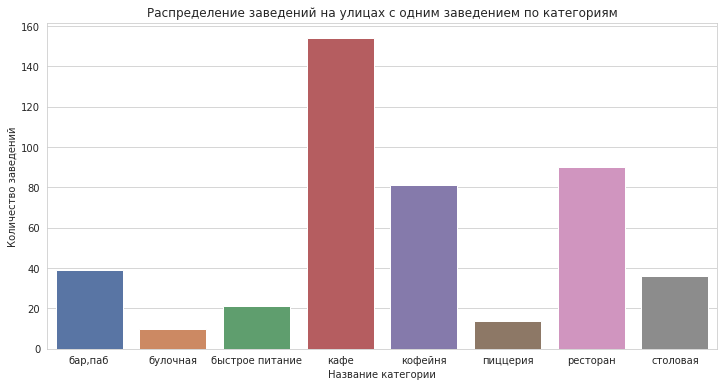

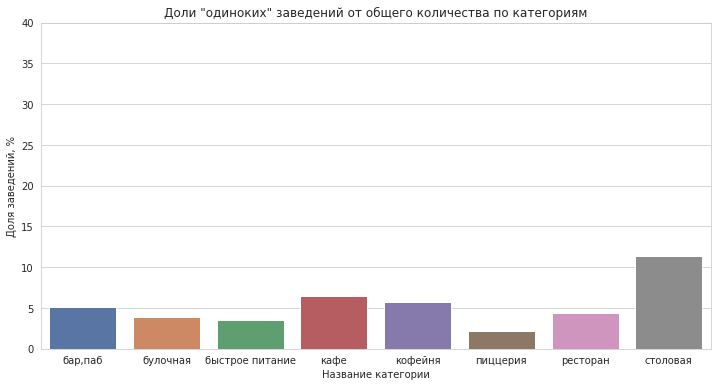

In [43]:
#график распределения заведений по категориям
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='category', y='amount', data=one_street_cat) 
ax.set_title('Распределение заведений на улицах с одним заведением по категориям')
ax.set_xlabel('Название категории')
ax.set_ylabel('Количество заведений')
plt.show()
#график долей заведений по категориям
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='category', y='share_of_total, %', data=one_street_cat) 
ax.set_title('Доли "одиноких" заведений от общего количества по категориям')
ax.set_xlabel('Название категории')
ax.set_ylabel('Доля заведений, %')
ax.set_ylim(0, 40)
plt.show()

В абсолютных значениях преобладают кафе, рестораны и кофейни, как и в целом по городу. Но наибольшая доля "одиноких" заведений от общего количества в категории среди столовых, на втором месте — кафе, на третьем — кофейни.

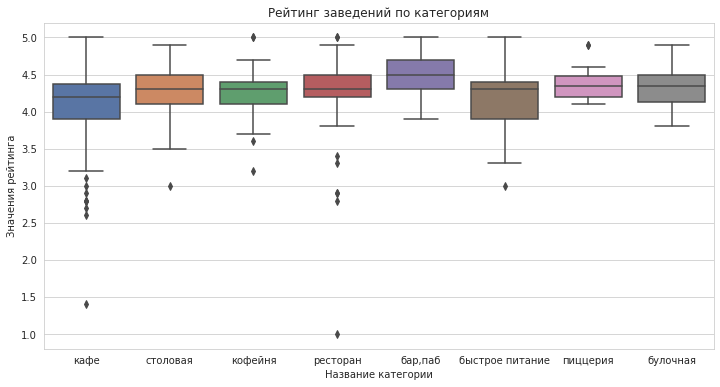

In [44]:
#диаграмма размаха рейтинга заведений по категориям
plt.figure(figsize=(12, 6))
ax = sns.boxplot(x='category', y='rating', data=one_street_places) 
ax.set_title('Рейтинг заведений по категориям')
ax.set_xlabel('Название категории')
ax.set_ylabel('Значения рейтинга')
plt.show()

Любопытно, что для "одиноких" заведений являются нормальными максимальные рейтинги не только для кафе и баров, пабов, но и для быстрого питания. Баров, пабов, пиццерий, булочных с низкими рейтингами нет вообще.

Можно предположить, что:
- либо заведения в единственном числе являются "последними выжившими", которые выжили благодаря высокому качеству блюд/сервиса
- либо заведомо размещение на непопулярных улицах позволяют себе только те заведения, которые уверены в качестве своих блюд/услуг и готовы продолжать прикладывать все усилия для поддержания уровня, или же популярные сети

Проверим, каких заведений среди "одиноких" больше: сетевых, или несетевых.

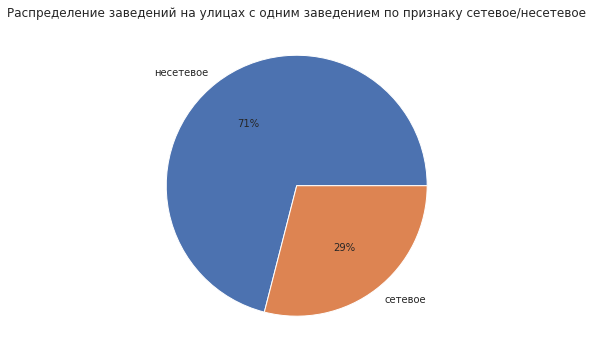

In [45]:
chain_data_1 = one_street_places.groupby('chain_text', as_index=False)['name'].count().sort_values(by='name', 
            ascending=False).rename(columns={'name' : 'amount'})
#график распределения заведений по признаку сетевое/несетевое
ax = chain_data_1.plot(kind='pie', y='amount', labels=chain_data_1['chain_text'], colors = colors, 
                   autopct='%.0f%%', figsize=(12, 6), legend=False)
ax.set_title('Распределение заведений на улицах с одним заведением по признаку сетевое/несетевое')
ax.set_ylabel(None)
plt.show()

Несетевые доминируют более, чем в два раза, поэтому предположение о преобладании среди "одиноких" заведений сетей отметается.

Проверим, какой ценовой сегмент среди них преобладает.

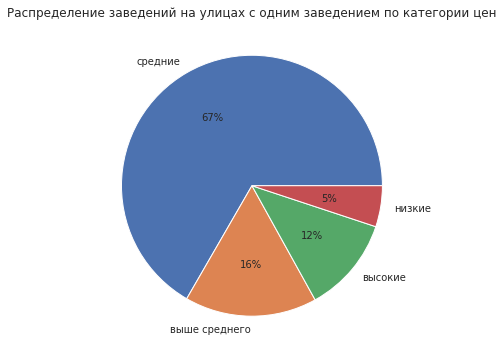

In [46]:
price_data_1 = one_street_places.groupby('price', as_index=False)['name'].count().sort_values(by='name', 
            ascending=False).rename(columns={'name' : 'amount'})
#график распределения заведений по категории цен
ax = price_data_1.plot(kind='pie', y='amount', labels=price_data_1['price'], colors = colors, 
                   autopct='%.0f%%', figsize=(12, 6), legend=False) 
ax.set_title('Распределение заведений на улицах с одним заведением по категории цен')
ax.set_ylabel(None)
plt.show()

В основном, среди заведений, находящихся на улицах в единственном экземпляре, преобладают заведения со средними ценами. Меньше всего заведений с низкими ценами.

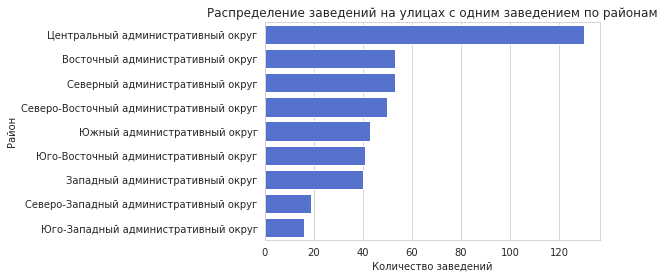

In [47]:
dist_data_1 = one_street_places.groupby('district', as_index=False)['name'].count().sort_values(by='name', 
            ascending=False).rename(columns={'name' : 'amount'})

#график распределения заведений по районам
ax = sns.barplot(x='amount', y='district', data=dist_data_1, color='#4169E1') 
ax.set_title('Распределение заведений на улицах с одним заведением по районам')
ax.set_ylabel('Район')
ax.set_xlabel('Количество заведений')
plt.show()

Больше всего "одиноких" заведений в Центральном округе.

<b>Выводы по "одиноким" заведениям</b>:
- в абсолютных значениях преобладают кафе, рестораны и кофейни, как и в целом по городу
- наибольшая доля "одиноких" заведений от общего количества в категории среди столовых, на втором месте — кафе, на третьем — кофейни
- для "одиноких" заведений максимальный рейтинг попадает в диапазон нормальных значений не только у кафе и баров, пабов, но и у категории быстрого питания. Баров, пабов, пиццерий, булочных с низкими рейтингами нет вообще. Вероятно, заведения в единственном числе являются "последними выжившими", которые выжили благодаря высокому качеству блюд/сервиса.
- несетевых заведений больше в два раза, чем сетевых 
- в основном, преобладают заведения со средними ценами, а заведений с низкими ценами меньше всего
- больше всего "одиноких" заведений в Центральном административном округе

### Заведения с плохими рейтингами

In [48]:
#фильтрация заведений с рейтингом ниже, или равным 3.5
low_rating_data = data[data['rating'] <= 3.5]

In [49]:
#подсчет доли заведений с низким рейтингом от общего количества по категориям
low_rating_cat = (
    low_rating_data.groupby('category', as_index=False)['name'].count().rename(columns={'name' : 'low_amount'})
    .sort_values(by='low_amount', ascending=False)
)
low_rating_cat = low_rating_cat.merge(all_cat, on='category')
low_rating_cat['share_of_total, %'] = round(low_rating_cat['low_amount'] / low_rating_cat['total']*100, 2)

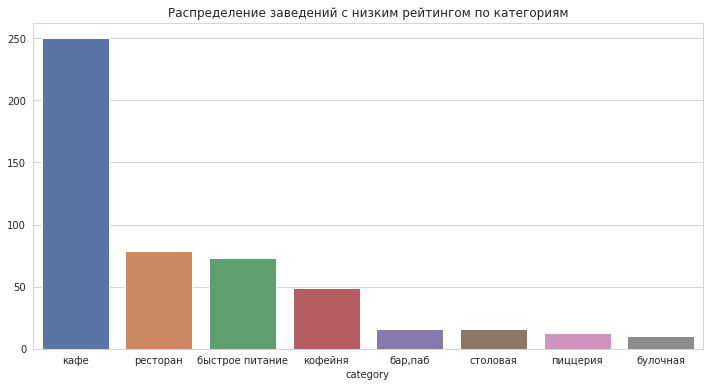

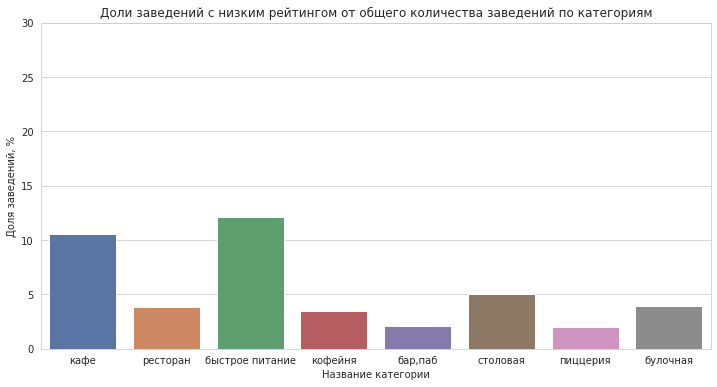

In [50]:
#график распределения заведений с низким рейтингом по категориям
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='category', y='low_amount', data=low_rating_cat) 
ax.set_title('Распределение заведений с низким рейтингом по категориям')
ax.set_ylabel(None)
plt.show()

#график долей заведений с низким рейтингом по категориям (относительные значения)
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='category', y='share_of_total, %', data=low_rating_cat) 
ax.set_title('Доли заведений с низким рейтингом от общего количества заведений по категориям')
ax.set_xlabel('Название категории')
ax.set_ylabel('Доля заведений, %')
ax.set_ylim(0, 30)
plt.show()

Из графика можно сделать вывод, что среди заведений с низким рейтингом больше всего кафе. На втором месте — категория ресторан, на третьем — быстрое питание. Но самая большая доля заведений с низким рейтингом от общего количества заведений по категориям приходится на быстрое питание, на втором месте — кафе, на третьем — столовые.

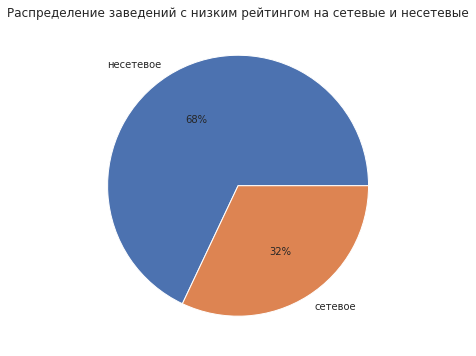

,chain_text,low_amount
0,несетевое,344
1,сетевое,162


In [51]:
low_rating_chain = low_rating_data.groupby('chain_text', as_index=False)['name'].count()\
.rename(columns={'name' : 'low_amount'})
#график распределения заведений с низким рейтингом по признаку
ax = low_rating_chain.plot(kind='pie', y='low_amount', labels=low_rating_chain['chain_text'], colors = colors, 
                   autopct='%.0f%%', figsize=(12, 6), legend=False)  
ax.set_title('Распределение заведений с низким рейтингом на сетевые и несетевые')
ax.set_ylabel(None)
plt.show()
#вывод подсчета количества сетевых и не сетевых заведений
display(low_rating_chain)

И здесь преобладают несетевые заведения, которых почти вдвое больше, чем сетевых.

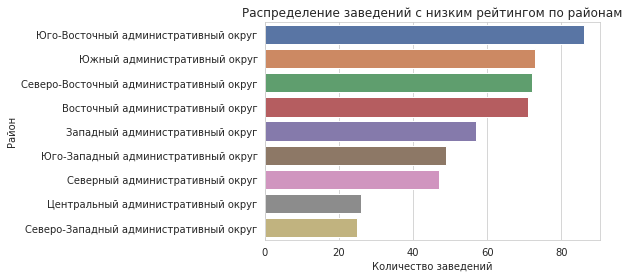

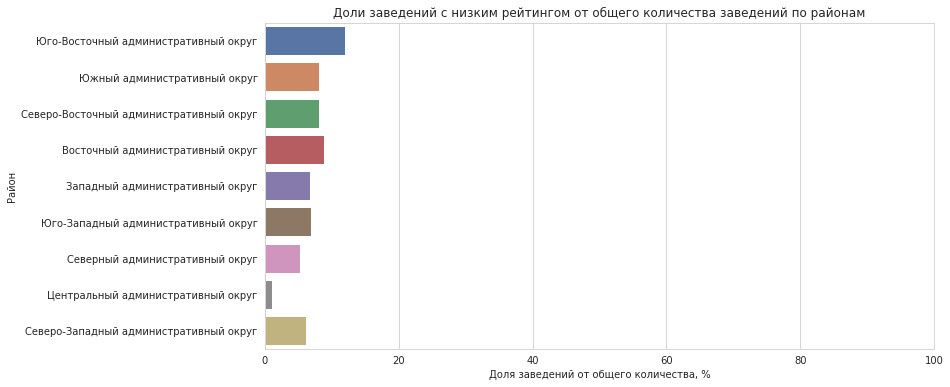

In [52]:
#подсчет доли заведений с низким рейтингом от общего количества по районам
low_rating_dist = (
    low_rating_data.groupby('district', as_index=False)['name'].count().rename(columns={'name' : 'low_amount'})
    .sort_values(by='low_amount', ascending=False)
)
all_dist = data.groupby('district', as_index=False)['name'].count().rename(columns={'name' : 'total'})
low_rating_dist = low_rating_dist.merge(all_dist, on='district')
low_rating_dist['share_of_total, %'] = round(low_rating_dist['low_amount'] / low_rating_dist['total']*100, 2)

#график распределения заведений с низким рейтингом по районам
ax = sns.barplot(x='low_amount', y='district', data=low_rating_dist)
ax.set_title('Распределение заведений с низким рейтингом по районам')
ax.set_ylabel('Район')
ax.set_xlabel('Количество заведений')
plt.show()

#график распределения заведений с низким рейтингом по районам
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='share_of_total, %', y='district',data=low_rating_dist) 
ax.set_title('Доли заведений с низким рейтингом от общего количества заведений по районам')
ax.set_xlabel('Доля заведений от общего количества, %')
ax.set_ylabel('Район')
ax.set_xlim(0, 100)
plt.show()

Самое большое количество заведений с низким рейтингом находится в Юго-Восточном административном округе и в абсолютных, и в относительных значениях.

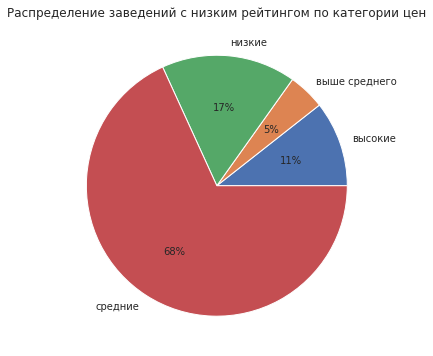

In [53]:
#подсчет распределения заведений с низким рейтингом по категориям цен
low_rating_price = (
    low_rating_data.groupby('price', as_index=False)['name'].count().rename(columns={'name' : 'low_amount'})
)
#график распределения заведений с низким рейтингом по категориям цен
ax = low_rating_price.plot(kind='pie', y='low_amount', labels=low_rating_price['price'], colors = colors, 
                   autopct='%.0f%%', figsize=(12, 6), legend=False) 
ax.set_title('Распределение заведений c низким рейтингом по категории цен')
ax.set_ylabel(None)
plt.show()

Как правило, в заведениях с низким рейтингом средние цены, либо низкие.

In [54]:
#подсчет медианных средних чеков по районам
district_bill_low_rating = low_rating_data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')

#создание карты Москвы
ml = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

#создание хороплета по средним чекам и добавление его на карту
Choropleth(
    geo_data=state_geo,
    data=district_bill_low_rating,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Медианный средний чек по районам в заведениях с низким рейтингом'
).add_to(ml)

#вывод карты
ml

Высокий средний чек для заведений с низкими рейтингами наблюдается в центре, что соответствует данным по всему датасету, и на юго-востоке и юге — здесь наблюдаем отличие от общих данных.

<b>Выводы по заведениям с плохими рейтингами</b>:
- в абсолютных значениях среди заведений с низким рейтингом больше всего кафе, на втором месте — категория ресторан, на третьем — быстрое питание
- относительно общего количества заведений по категориям, самая большая доля заведений с низким рейтингом приходится на быстрое питание, на втором месте — кафе, на третьем — столовые
- преобладают несетевые заведения, которых почти вдвое больше, чем сетевых
- самое большое количество заведений с низким рейтингом находится в Юго-Восточном административном округе и в абсолютных, и в относительных значениях
- как правило, в заведениях с низким рейтингом средние цены, либо низкие, цены выше среднего встречаются реже всего
- высокий средний чек для заведений с низкими рейтингами наблюдается в центре, что соответствует данным по всему датасету, и на юго-востоке и юге — здесь наблюдаем отличие от общих данных

## Исследование кофеен

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Заказчики не боятся конкуренции в этой сфере. Попробуем определить, осуществима ли мечта клиентов.

Для начала, узнаем, сколько всего кофеен в датасете.

In [55]:
#подсчет кофеен и их доли от общего количества заведений
print('Всего кофеен:', len(data[data['category'] == 'кофейня']))
print('Доля кофеен в датасете:', round(len(data[data['category'] == 'кофейня']) / len(data) * 100, 2), '%')

Всего кофеен: 1413
Доля кофеен в датасете: 16.82 %


В целом, достаточное количество для анализа и выводов.

Построим график, отражающий их распределение по районам Москвы.

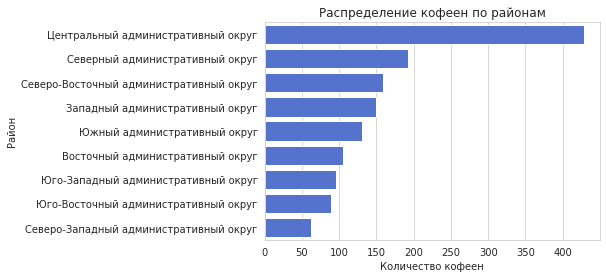

In [56]:
#подсчет кофеен по районам
cofeeshop_district = data[data['category'] == 'кофейня'].groupby('district', 
as_index=False)['name'].count().sort_values(by='name', ascending=False).rename(columns={'name':'coffeshop_amount'})
#график распределения кофеен по районам
ax = sns.barplot(x='coffeshop_amount',y='district', data=cofeeshop_district, color='#4169E1')  
ax.set_title('Распределение кофеен по районам')
ax.set_ylabel('Район')
ax.set_xlabel('Количество кофеен')
plt.show()

Больше всего кофеен в Центральном округе, как и в целом заведений общепита. Конкуренция в центре будет достаточно высокой, но большое количество кофеен отражает и повышенный спрос на них в этом районе. 

Меньше всего кофеен на северо-западе, юго-востоке и юго-западе. Следовательно, меньше и конкурентов, но стоит учесть качественные характеристики этих конкурентов.

In [57]:
#фильтрация данных о кофейнях
cofeeshop_data = data[data['category'] == 'кофейня']
#создание столбца с отметкой о круглосуточности для построения графика
cofeeshop_data['is_24_7_text'] = cofeeshop_data['is_24_7'].apply(lambda x: 'круглосуточно' if x == True 
                                                                 else 'не круглосуточно')

In [58]:
#создание карты Москвы
c = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
marker_cluster_c = MarkerCluster().add_to(c)

#функция, которая создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster_c)

#применение функции create_clusters() к каждой строке датафрейма
cofeeshop_data.apply(create_clusters, axis=1)

#вывод карты
c

На карте видно, как количество кофеен убывает по мере удаления от центра.

Круглосуточных кофеен: 59


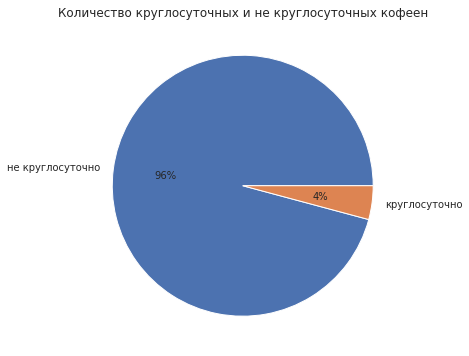

In [59]:
print('Круглосуточных кофеен:', cofeeshop_data['is_24_7'].sum())

cofeeshop_24_7 = cofeeshop_data.groupby('is_24_7_text', as_index=False)['name'].count()\
.sort_values(by='name', ascending=False).rename(columns={'name':'coffeshop_amount'})
#график распределения кофеен по районам
ax = cofeeshop_24_7.plot(kind='pie', y='coffeshop_amount', labels=cofeeshop_24_7['is_24_7_text'], colors = colors, 
                   autopct='%.0f%%', figsize=(12, 6), legend=False)  
ax.set_title('Количество круглосуточных и не круглосуточных кофеен')
ax.set_ylabel(None)
plt.show()

По графику видно, что круглосуточных кофеен очень мало. В этом есть логика: судя по всему, любителей выпить кофе ночью не так много.

In [60]:
#подсчет среднего рейтинга кофеен по районам
district_c_rating = cofeeshop_data.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating',
                                                                                                    ascending=False)
district_c_rating['rating'] = round(district_c_rating['rating'], 2)
district_c_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
7,Юго-Западный административный округ,4.28
0,Восточный административный округ,4.28
8,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


По среднему значению лидирует Центральный округ, практически наравне с ним Северо-Западный. Самое низкое среднее значение среднего рейтинга кофеен в Западном округе.

Изучим распределение средних рейтингов подробнее с помощью диаграммы размаха.

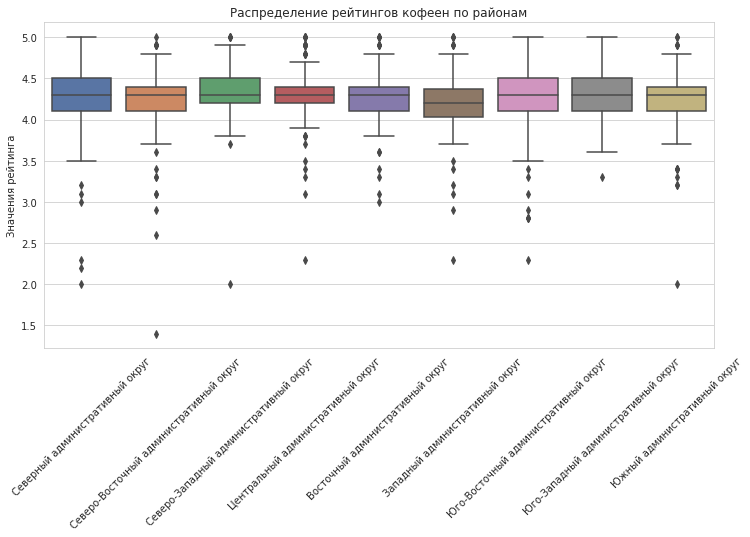

,district,rating
0,Восточный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
1,Западный административный округ,4.2


In [61]:
#диаграмма размаха средних рейтингов кофеен по районам
plt.figure(figsize=(12, 6))
ax = sns.boxplot(x='district', y='rating', data=cofeeshop_data) 
ax.set_title('Распределение рейтингов кофеен по районам')
ax.set_xlabel(None)
ax.set_ylabel('Значения рейтинга')
plt.xticks(rotation=45)
plt.show()

#вывод медианных рейтингов по районам
cofeeshop_data.groupby('district', as_index=False)['rating'].agg('median').sort_values(by='rating',ascending=False)

Любопытно, что на юго-западе не встречается кофеен с рейтингом ниже 3, в отличие от всех остальных районов, а максимальный рейтинг входит в диапазон нормальных значений. 

Кофейни в Центральном округе можно назвать "как правило, хорошими", т.к. в центре самый узкий диапазон нормальных значений. Но существует немало исключений, которые проиллюстрированы выбросами, при чем как приятных, так и не очень.

Медианные средние рейтинги кофеен одинаковы для большинства округов. Немного уступает остальным Западный административный округ.

Изучим стоимость кофе в кофейнях по районам. Для этого построим картограмму с визуализацией медианных значений средней стоимости чашки капучино.

In [62]:
#подсчет медианной цены чашки капучино по районам
district_cup = cofeeshop_data.groupby('district', as_index=False)['middle_coffee_cup'].median()

In [63]:
# создаём карту Москвы
dc = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Медианная стоимость чашки капучино по районам'
).add_to(dc)

# выводим карту
dc

In [64]:
#вывод медианных цен чашки капучино по районам
district_cup.sort_values(by='middle_coffee_cup', ascending=False)

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


Самые дорогие чашки капучино можно встретить в Юго-Западном, Центральном и Западном округах. Самые демократичные цены на востоке.

Изучим диаграмму размаха цен, чтобы выявить нормальные диапазоны цен для каждого из районов.

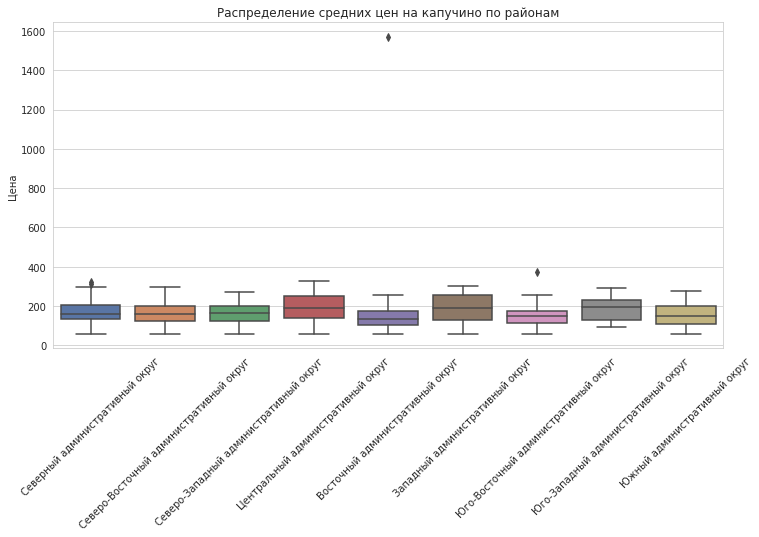

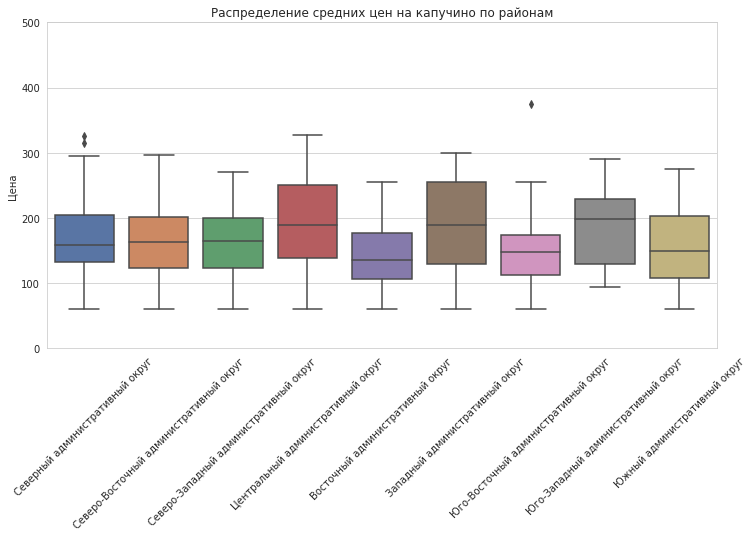

In [65]:
#диаграмма размаха средних цен на капучино по районам
plt.figure(figsize=(12, 6))
ax = sns.boxplot(x='district', y='middle_coffee_cup', data=cofeeshop_data) 
ax.set_title('Распределение средних цен на капучино по районам')
ax.set_xlabel(None)
ax.set_ylabel('Цена')
plt.xticks(rotation=45)
plt.show()

#диаграмма размаха средних цен на капучино по районам в другом масштабе
plt.figure(figsize=(12, 6))
ax = sns.boxplot(x='district', y='middle_coffee_cup', data=cofeeshop_data) 
ax.set_title('Распределение средних цен на капучино по районам')
ax.set_xlabel(None)
ax.set_ylabel('Цена')
ax.set_ylim(0, 500)
plt.xticks(rotation=45)
plt.show()

По диаграммам видно, что заведений, где цены сильно выбиваются из нормального диапазона, очень мало. В основном, цены варьируются между 150 и 300 рублями за чашку (в центре и за редкими исключениями в остальных районах чуть выше, не не более 350 рублей). 

Есть одно заведение на востоке с неправдоподобно высоким значением цены и более реалистичный выброс на юго-востоке. Выведем строки с этими заведениями.

In [66]:
#вывод строк с кофейнями, где средняя цена чашки капучино выше 350 рублей
data[data['middle_coffee_cup'] > 350]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,full_address,street,is_24_7,chain_text
2857,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48,"[Москва, Большая Семёновская улица, 27, корп. 1]",Большая Семёновская улица,False,сетевое
5500,coffee fm,кофейня,"Москва, Авиамоторная улица, 10, корп. 1",Юго-Восточный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–19:00",55.754233,37.715491,4.3,NaN,Цена чашки капучино:250–500 ₽,NaN,375.0,0,190,"[Москва, Авиамоторная улица, 10, корп. 1]",Авиамоторная улица,False,несетевое


В случае с Шоколадницей, скорее всего, указана ошибочная верхняя граница цены в столбце `avg_bill`, на основе которого рассчитывалась средняя цена. Если бы диапазон действительно был таким, то одним заведением из самой большой сети не обошлось бы. К тому же, категория цен из столбца `price` не соответствует таким ценам на капучино.

Цены в Coffee FM больше похожи на реальные. Возможно, в заведении такая ценовая политика.

<b>Выводы по исследованию кофеен и рекомендации</b>: 
1. Больше всего кофеен в Центральном округе, как и в целом заведений общепита, и количество кофеен убывает по мере удаления от центра. Конкуренция в центре будет достаточно высокой, но большое количество кофеен отражает и повышенный спрос на них в этом районе. Меньше всего кофеен на северо-западе, юго-востоке и юго-западе. Следовательно, меньше и конкурентов, но стоит учесть качественные характеристики этих конкурентов.

2. На высокую конкуренцию указывает не только количество кофеен в ЦАО. Также в этом районе самое высокое среднее значение среднего рейтинга заведений (4.34), но медианный рейтинг не отличается от всех остальных районов (4.3) Поэтому есть кого опережать и куда расти. 

3. Стоимость чашки капучино имеет смысл формировать, отталкиваясь от локации, в которой принято решение открыть кофейню, и ориентируясь на медианную цену по району. Это с большой вероятностью обеспечит баланс между доступностью и качеством. Для Центрального административного округа ориентиром может быть цена 190 рублей за чашку.

4. Круглосуточных кофеен очень мало. В этом есть логика: судя по всему, любителей выпить кофе ночью не так много, а значит и спрос низкий. Следовательно, круглосуточность, скорее всего, не будет являться сильным преимуществом. 

## Вывод

<b>Что сделано</b>: подготовлены к анализу данные, проведено исследование данных о заведениях общепита в Москве, сформулированы выводы, которые в будущем помогут в выборе подходящего инвесторам места для открытия своего заведения.

<b>Выводы по общему анализу заведений</b>: 

1. Категории заведений:
- самые многочисленные категории заведений в датасете — кафе и рестораны, булочные и столовые — в меньшинстве
- наиболее вместительны бары, пабы, рестораны и кофейни, а наиболее компактными являются булочные, пиццерии и кафе
- несетевых заведений больше, чем сетевых, в 1,6 раз

2. Сетевые заведения:
- среди сетевых заведений больше всего кафе, ресторанов и кофеен, а меньше всего столовых и булочных; среди несетевых тоже больше всего кафе, ресторанов и кофеен, но кафе и рестораны выделяются более значительно, а в меньшинстве среди несетевых тоже булочные и столовые
- самая популярная сеть по количеству заведений — Шоколадница, второе и третье места занимают Домино'с пицца и Додо пицца соответственно 
- чаще среди сетей-лидеров встречаются кафе, кофейни — на втором месте, рестораны — на третьем

3. Заведения по районам:
- по количеству заведений общепита лидирует Центральный административный округ, наиболее многочисленной категорией в центре являются рестораны, а кафе преобладают по количеству во всех остальных районах
- меньше всего заведений общепита в Северо-Западном административном округе

4. Наиболее высокий рейтинг имеют заведения в Центральном административном округе, за ним идут Северный и Северо-Западный. Наиболее низкий средний рейтинг — в Юго-Восточном округе.

5. Среди самых популярных улиц наибольшее количество кафе, ресторанов и кофеен приходится на проспект Мира. Второе и третье места по количеству ресторанов лидируют проспекты Вернадского и Ленинский. Второе место по количеству кафе занимает улица Профсоюзная, а второе место по количеству кофеен занимает Ленинградский проспект.

6. Удаленность от центра не всегда влияет на средний чек. Действительно, медианный средний чек наиболее высокий в центре, но западные районы не отстают. Наиболее низкий средний чек на юге, юго-востоке и северо-востоке.

7. В абсолютных значениях больше всего круглосуточных заведений среди кафе, но самая высокая доля круглосуточных заведений от общего количества заведений в категории быстрое питание.

8. Больше всего круглосуточных заведений в центре, также центр лидирует по количеству круглосуточных баров, пабов, ресторанов, кофеен и столовых. Круглосуточных кафе и пиццерий больше всего на юго-востоке. По круглосуточному быстрому питанию лидирует юг. Круглосуточные булочные находятся, в основном, на востоке. 

<b>Выводы по заведениям на улицах, на которых находится только один объект общепита</b>:
- в абсолютных значениях преобладают кафе, рестораны и кофейни, как и в целом по городу
- наибольшая доля "одиноких" заведений от общего количества в категории среди столовых, на втором месте — кафе, на третьем — кофейни
- максимальный рейтинг попадает в диапазон нормальных значений не только у кафе и баров, пабов, но и у категории быстрого питания. Баров, пабов, пиццерий, булочных с низкими рейтингами нет вообще. Есть предположение, что заведения в единственном числе являются "последними выжившими", которые выжили благодаря высокому качеству блюд/сервиса.
- несетевых заведений больше в два раза, чем сетевых 
- в основном, преобладают заведения со средними ценами, а заведений с низкими ценами меньше всего
- больше всего "одиноких" заведений в Центральном административном округе

<b>Выводы по заведениям с плохими рейтингами</b>:
- в абсолютных значениях среди заведений с низким рейтингом больше всего кафе, на втором месте — категория ресторан, на третьем — быстрое питание
- относительно общего количества заведений по категориям, самая большая доля заведений с низким рейтингом приходится на быстрое питание, на втором месте — кафе, на третьем — столовые
- преобладают несетевые заведения, которых почти вдвое больше, чем сетевых
- самое большое количество заведений с низким рейтингом находится в Юго-Восточном административном округе и в абсолютных, и в относительных значениях
- как правило, в заведениях с низким рейтингом средние цены, либо низкие, цены выше среднего встречаются реже всего
- высокий средний чек для заведений с низкими рейтингами наблюдается в центре, что соответствует данным по всему датасету, и на юго-востоке и юге — здесь наблюдаем отличие от общих данных

<b>Выводы по исследованию кофеен</b>: 
1. Больше всего кофеен в Центральном округе, как и в целом заведений общепита, и количество кофеен убывает по мере удаления от центра. Конкуренция в центре будет достаточно высокой, но большое количество кофеен отражает и повышенный спрос на них в этом районе. Меньше всего кофеен на северо-западе, юго-востоке и юго-западе. Следовательно, меньше и конкурентов, но стоит учесть качественные характеристики этих конкурентов.

2. На высокую конкуренцию указывает не только количество кофеен в ЦАО. Также в этом районе самое высокое среднее значение среднего рейтинга заведений (4.34), но медианный рейтинг не отличается от всех остальных районов (4.3) Поэтому есть кого опережать и куда расти. 

3. Стоимость чашки капучино имеет смысл формировать, отталкиваясь от локации, в которой принято решение открыть кофейню, и ориентируясь на медианную цену по району. Это с большой вероятностью обеспечит баланс между доступностью и качеством. Для Центрального административного округа ориентиром может быть цена 190 рублей за чашку.

4. Круглосуточных кофеен очень мало. В этом есть логика: судя по всему, любителей выпить кофе ночью не так много, а значит и спрос низкий. Следовательно, круглосуточность, скорее всего, не будет являться сильным преимуществом. 

<b>Рекомендации</b>: 
1. Поскольку высокая конкуренция не является блокером для заказчика, рекомендую рассмотреть для запуска кофейни Центральный административный округ, где больше всего кофеен, а, следовательно, и спроса.
2. При формировании стоимости чашки капучино в качестве ориентира использовать цену 190 рублей. 
3. Не использовать формат круглосуточной кофейни, т.к. это вряд ли станет конкурентным преимуществом.

## Презентация

Презентация для заказчика: <https://drive.google.com/file/d/1YoNXQU3dSNmt3io11u9G_lKf96E9YVoj/view?usp=sharing>